In [61]:
import numpy as np
import gc
import os
import sys
import matplotlib.pyplot as plt

sys.path.append("../")
sys.path.append("../03_experimental_data_chemical_shifts/")


import SRT_optimization as srt

from matplotlib.backends.backend_pdf import PdfPages
import scipy

In [42]:
BMBR_path="../../../CorysPeptides/sds_vs_peptide/BMRB_experimental_data/"
def load_BMBR(BMBR_path:str):
    # load in experimental data
    experiments={}
    for root, dirs, files in os.walk(BMBR_path):
        if len(files)==1:
            file=root+"/"+files[0]
            with open(file,"r") as f:
                read_relaxations=False
                read_shifts=False
                counter_relaxations=0 # saves data when -1
                counter_shifts=0 # saves data when -1
                for idline,line in enumerate(f):
                    counter_relaxations+=1
                    counter_shifts+=1
                    if "_Entry.ID" in line:
                        ID=line.split()[1]
                        experiments[ID]={}
                        experiments[ID]["disordered"]=False
                        experiments[ID]["micelle"]=False
                        experiments[ID]["T2measur"]={}
                    if '_Heteronucl_T2_list.Sf_framecode' in line:
                        mesurment=line.split()[1]
                    if '_Heteronucl_T2_list.Sample_condition_list_label' in line:
                        condition=line.split()[1]
                        if condition not in experiments[ID]["T2measur"]:
                            experiments[ID]["T2measur"][condition]={}
                        experiments[ID]["T2measur"][condition][mesurment]={}
                    if "_Heteronucl_T2_list.Spectrometer_frequency_1H" in line:
                        field=line.split()[1]
                        try:
                            if float(field)>1100:
                                field=float(field)/1000000
                            experiments[ID]["T2measur"][condition][mesurment]['field']=float(field)
                        except:
                            print(ID,field)


                        
                        experiments[ID]["T2measur"][condition][mesurment]["results"]={}
                        experiments[ID]["T2measur"][condition][mesurment]["results"]["AA"]=[]
                        experiments[ID]["T2measur"][condition][mesurment]["results"]["atomID"]=[]
                        experiments[ID]["T2measur"][condition][mesurment]["results"]["R2"]=[]
                    
                    if "_Heteronucl_T2_list.T2_val_units" in line:
                        units=line.split()[1]
                        experiments[ID]["T2measur"][condition][mesurment]["units"]=units
                    if "_T2.Heteronucl_T2_list_ID" in line:
                        counter_relaxations=-3
                    if counter_relaxations==-1:
                        read_relaxations=True
                    if read_relaxations:
                        if len(line.split())==21:
                            experiments[ID]["T2measur"][condition][mesurment]['expType']=line.split()[7]
                            if experiments[ID]["T2measur"][condition][mesurment]["units"]=="s-1" or experiments[ID]["T2measur"][condition][mesurment]["units"]=="Hz":
                                try:
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["R2"].append(float(line.split()[10]))
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["AA"].append(line.split()[6])
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["atomID"].append(int(line.split()[5]))
                            
                                except:
                                    pass
                            elif experiments[ID]["T2measur"][condition][mesurment]["units"]=="s":
                                try:
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["R2"].append(1/float(line.split()[10]))
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["AA"].append(line.split()[6])
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["atomID"].append(int(line.split()[5]))
                            
                                except:
                                    pass
                            elif experiments[ID]["T2measur"][condition][mesurment]["units"]=="ms":
                                try:
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["R2"].append(1/float(line.split()[10])*1000)
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["AA"].append(line.split()[6])
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["atomID"].append(int(line.split()[5]))
                            
                                except:
                                    pass
                            elif experiments[ID]["T2measur"][condition][mesurment]["units"]=="ms-1":
                                try:
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["R2"].append(float(line.split()[10])/1000)
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["AA"].append(line.split()[6])
                                    experiments[ID]["T2measur"][condition][mesurment]["results"]["atomID"].append(int(line.split()[5]))
                            
                                except:
                                    pass
                        else:
                            read_relaxations=False
                    

                    if ("disorder" in line or "Disorder" in line):
                        experiments[ID]["disordered"]=True

                    if ("micelle" in line or "Micelle" in line):
                        experiments[ID]["micelle"]=True
                    if "_Assembly.Molecular_mass" in line:

                        if line.split()[1]!=".":
                            experiments[ID]["weight"]=float(line.split()[1])
                        else:
                            experiments[ID]["weight"]=None
    return experiments

In [43]:
experiments=load_BMBR(BMBR_path)

4697 .


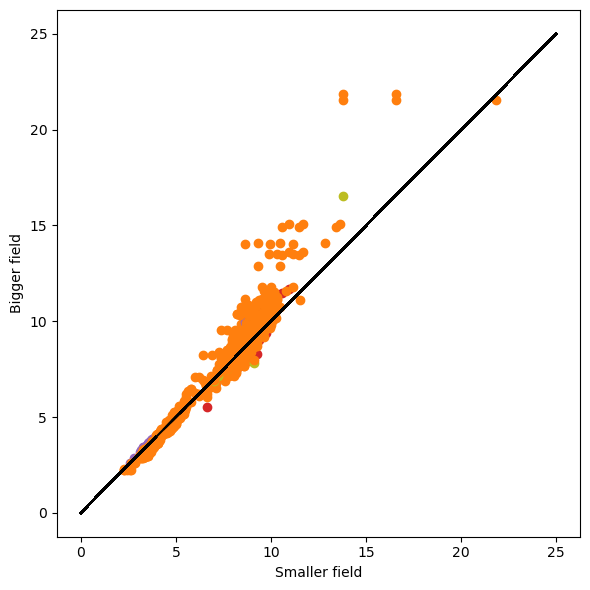

In [59]:
plt.rcParams["figure.autolayout"] = True
smallers={300:0, 360:1, 400:2, 500:3, 600:4, 700:5, 800:6, 850:7}
biggers={400:9, 500:8, 600:7, 700:6, 720:5, 750:4, 800:3, 850:2, 900:1, 950:0}




fig, axs = plt.subplots(1,1,figsize=(6,6),sharex=True,sharey=True)

for i,entry in enumerate(experiments):
    if entry in ['18864','16360','26845','6243']:
        for condition in experiments[entry]['T2measur']:
            if len(experiments[entry]['T2measur'][condition])>1:
                #print(entry)
                fields={}
                for meas in experiments[entry]['T2measur'][condition]:
                    if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
                        fields[experiments[entry]['T2measur'][condition][meas]['field']]=meas
                fields=dict(sorted(fields.items()))

                for smaller_c in fields:
                    for bigger_c in fields:
                        if bigger_c>smaller_c:

                            if int(float(smaller_c))%10==0:
                                smaller=(int(float(smaller_c)))
                                smaller_s=smaller_c
                            else:
                                smaller=(int(float(smaller_c)))+1
                                smaller_s=smaller_c
                            if int(float(bigger_c))%10==0:
                                bigger=(int(float(bigger_c)))
                                bigger_s=bigger_c
                            else:
                                bigger=(int(float(bigger_c)))+1
                                bigger_s=bigger_c


                            small=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["R2"]:
                                try:
                                    #small.append(srt.find_tau_from_R2_np_poly1d(float(smaller_s),float(R2))*10**9)
                                    small.append(srt.find_tau_from_R2_hyperbolic_approximation(float(smaller_s),float(R2))*10**9)
                                except :
  
                                    small.append(None)



                            big=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["R2"]:
                                try:
                                    #big.append(srt.find_tau_from_R2_np_poly1d(float(bigger_s),float(R2))*10**9)
                                    big.append(srt.find_tau_from_R2_hyperbolic_approximation(float(bigger_s),float(R2))*10**9)
                                except:
                                    big.append(None)
                            for pos,res in enumerate(experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["atomID"]):
                                if res in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"]:
                                    pos_big=experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"].index(res)
                                    if not small[pos]==None and not big[pos_big]==None:
                                        if experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["AA"][pos]==experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]['AA'][pos_big]:
                                            axs.plot(small[pos],big[pos_big],"o",c="C"+str(i))
                                            axs.plot([0,25],[0,25],'-',c='black')  
                            i=+1


axs.set_xlabel("Smaller field")
    
axs.set_ylabel("Bigger field")
plt.savefig('4fields_systems.png')

$sample_cond_1
 T2_500_micelles
[1.81, 2.4, 2.58, 2.69, 3.12, 2.84, 3.39, 4.69, 7.09, 6.33, 8.55, 8.62, 8.06, 8.93, 10.64, 10.1, 10.1, 9.62, 10.31, 10.2, 10.0, 9.9, 10.75, 8.7, 8.4, 8.06, 6.17, 3.83]
 T2_600_micelles
[2.04, 2.7, 2.42, 2.74, 3.48, 3.56, 3.55, 5.21, 7.35, 8.0, 8.7, 9.62, 8.47, 9.26, 10.2, 9.26, 10.75, 10.53, 10.2, 10.64, 9.8, 9.8, 10.0, 9.43, 9.17, 8.0, 6.71, 6.1, 4.37]
 T2_500_solution
[3.62, 5.1, 6.1, 6.94, 5.41, 5.75, 6.06, 6.17, 7.14, 7.14, 8.13, 7.52, 7.63, 7.42, 7.46, 8.48, 9.52, 7.75, 7.04, 7.35, 9.62, 4.85, 3.28, 2.09]
 T2_600_solution
[3.65, 5.75, 6.85, 7.41, 5.95, 6.29, 6.33, 6.71, 8.2, 8.0, 8.77, 9.01, 7.94, 8.26, 8.07, 8.4, 7.81, 8.62, 9.01, 8.2, 8.33, 8.33, 7.41, 7.82, 12.82, 5.53, 3.36, 2.31]


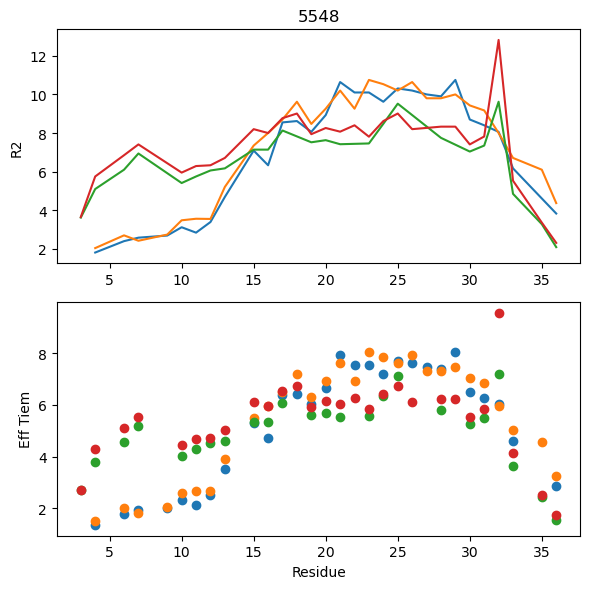

In [49]:
ID='5548'
fig, axs = plt.subplots(2,1,figsize=(6,6))
for i in experiments[ID]['T2measur']:
    print(i)
    for j in experiments[ID]['T2measur'][i]:
        print(f' {j}')
        print(experiments[ID]['T2measur'][i][j]['results']['R2'])
        if True:
            axs[0].plot(experiments[ID]['T2measur'][i][j]['results']['atomID'],experiments[ID]['T2measur'][i][j]['results']['R2'])
            eff=[]
            field=experiments[ID]['T2measur'][i][j]['field']
            for R2 in experiments[ID]['T2measur'][i][j]['results']['R2']:
                eff.append(srt.find_tau_from_R2_hyperbolic_approximation(float(field),float(R2))*10**9)
            axs[1].plot(experiments[ID]['T2measur'][i][j]['results']['atomID'],eff,'o')
    axs[1].set_xlabel('Residue')
    axs[0].set_ylabel('R2')
    axs[1].set_ylabel('Eff Tiem')
    axs[0].set_title('5548')
    plt.savefig('5548.png')

In [33]:
field

800.0

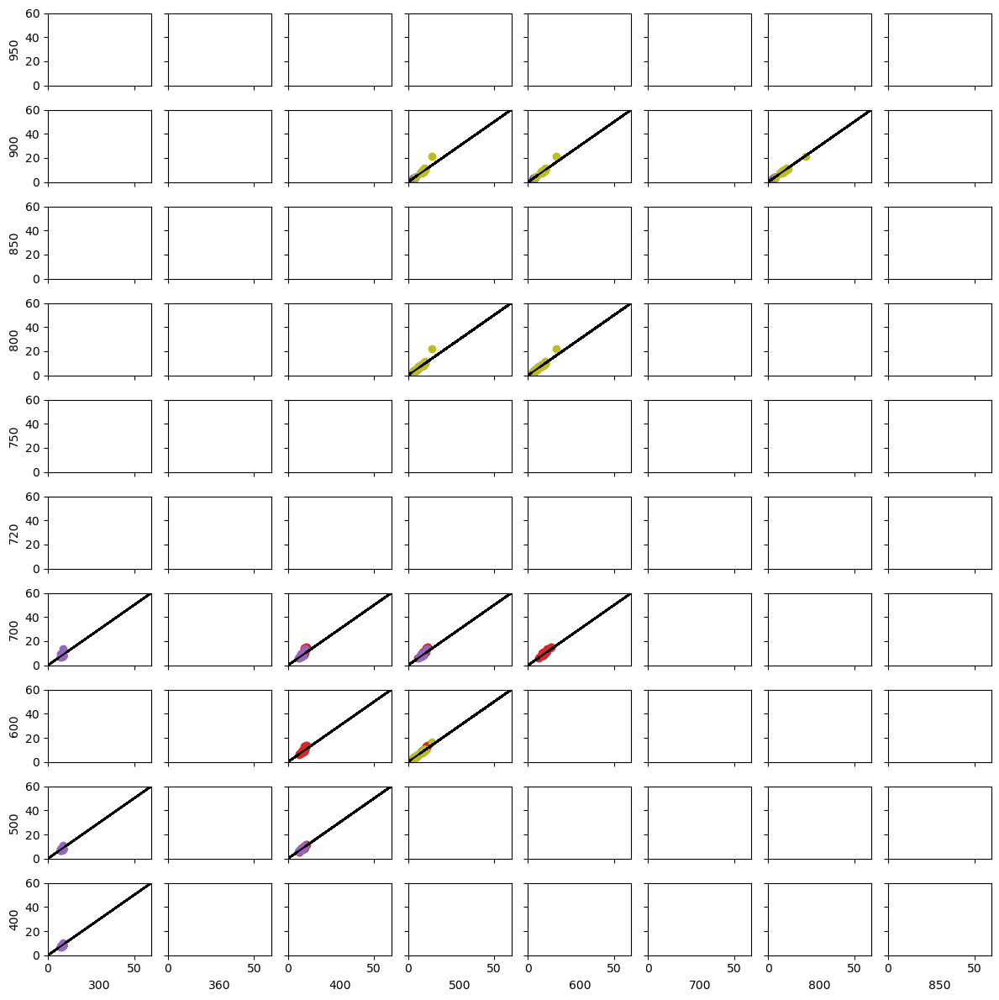

In [90]:
plt.rcParams["figure.autolayout"] = True
smallers={300:0, 360:1, 400:2, 500:3, 600:4, 700:5, 800:6, 850:7}
biggers={400:9, 500:8, 600:7, 700:6, 720:5, 750:4, 800:3, 850:2, 900:1, 950:0}




fig, axs = plt.subplots(10,8,figsize=(12,12),sharex=True,sharey=True)

for i,entry in enumerate(experiments):
    #if entry!='4697':
    if entry in ['18864','16360','26845','6243']:
        for condition in experiments[entry]['T2measur']:
            if len(experiments[entry]['T2measur'][condition])>1:
                #print(entry)
                fields={}
                for meas in experiments[entry]['T2measur'][condition]:
                    if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
                        fields[experiments[entry]['T2measur'][condition][meas]['field']]=meas
                fields=dict(sorted(fields.items()))

                for smaller_c in fields:
                    for bigger_c in fields:
                        if bigger_c>smaller_c:

                            if int(float(smaller_c))%10==0:
                                smaller=(int(float(smaller_c)))
                                smaller_s=smaller_c
                            else:
                                smaller=(int(float(smaller_c)))+1
                                smaller_s=smaller_c
                            if int(float(bigger_c))%10==0:
                                bigger=(int(float(bigger_c)))
                                bigger_s=bigger_c
                            else:
                                bigger=(int(float(bigger_c)))+1
                                bigger_s=bigger_c


                            small=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["R2"]:
                                try:
                                    #small.append(srt.find_tau_from_R2_np_poly1d(float(smaller_s),float(R2))*10**9)
                                    small.append(srt.find_tau_from_R2_hyperbolic_approximation(float(smaller_s),float(R2))*10**9)
                                except :
  
                                    small.append(None)



                            big=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["R2"]:
                                try:
                                    #big.append(srt.find_tau_from_R2_np_poly1d(float(bigger_s),float(R2))*10**9)
                                    big.append(srt.find_tau_from_R2_hyperbolic_approximation(float(bigger_s),float(R2))*10**9)
                                except:
                                    big.append(None)
                            for pos,res in enumerate(experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["atomID"]):
                                if res in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"]:
                                    pos_big=experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"].index(res)
                                    if not small[pos]==None and not big[pos_big]==None:
                                        if experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["AA"][pos]==experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]['AA'][pos_big]:
                                            axs[biggers[bigger],smallers[smaller]].plot(small[pos],big[pos_big],"o",c="C"+str(i))
                                            axs[biggers[bigger],smallers[smaller]].plot([0,60],[0,60],'-',c='black')  
                            



for xlabel,column in smallers.items():
    axs[9,column].set_xlabel(xlabel)
    
for ylabel,row in biggers.items():
    axs[row,0].set_ylabel(ylabel)
    
axs[0,0].set_ylim(0,60)
axs[0,0].set_xlim(0,60)
    
plt.savefig("field_dependency_lin_approx_corr_4fields.png")

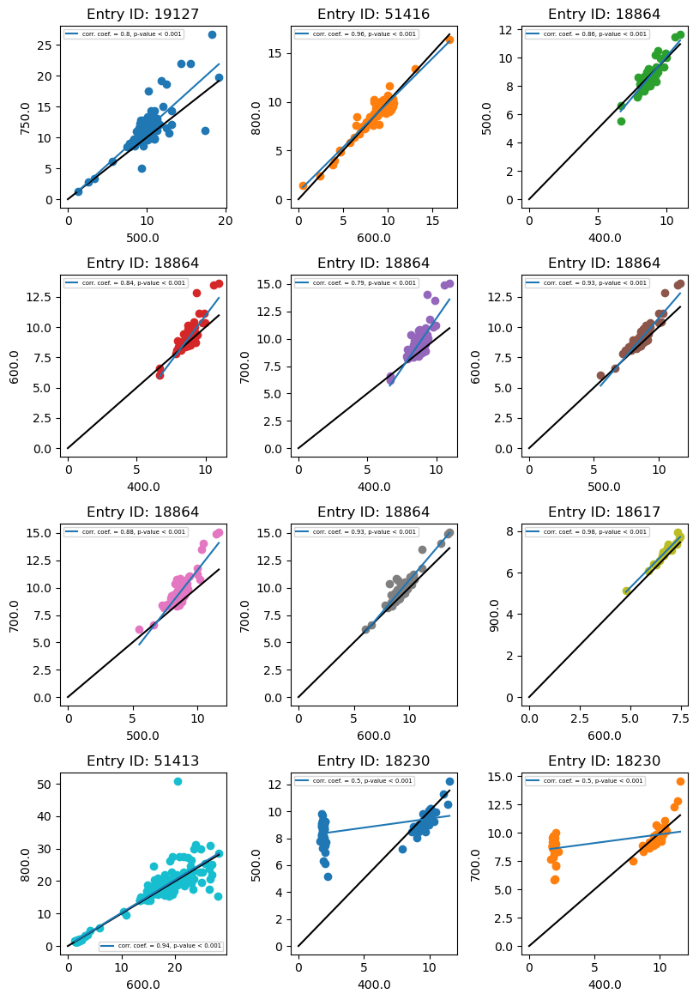

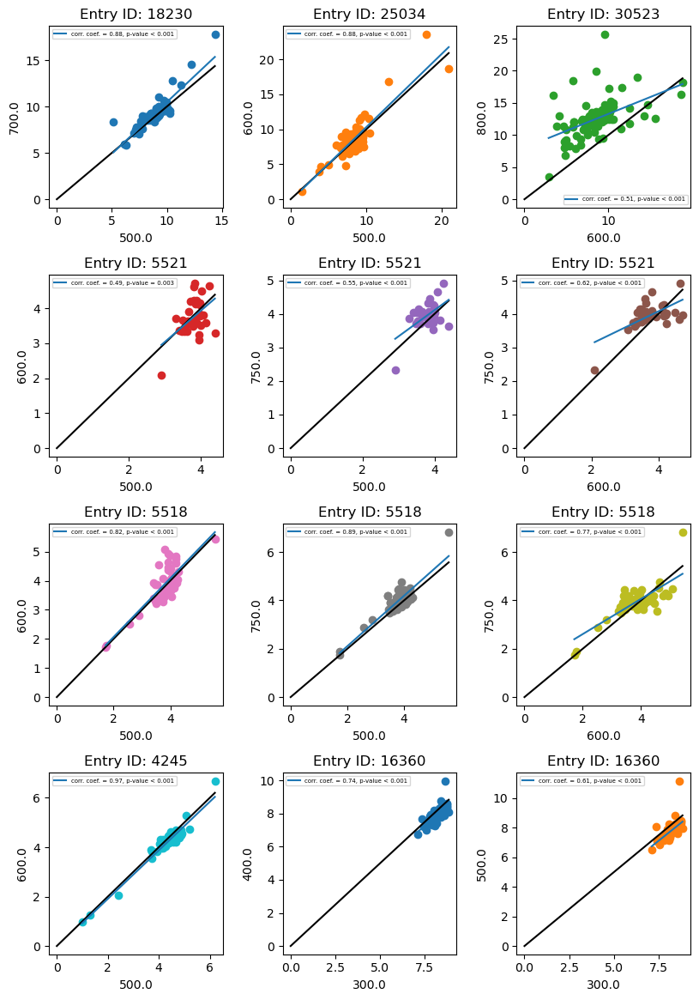

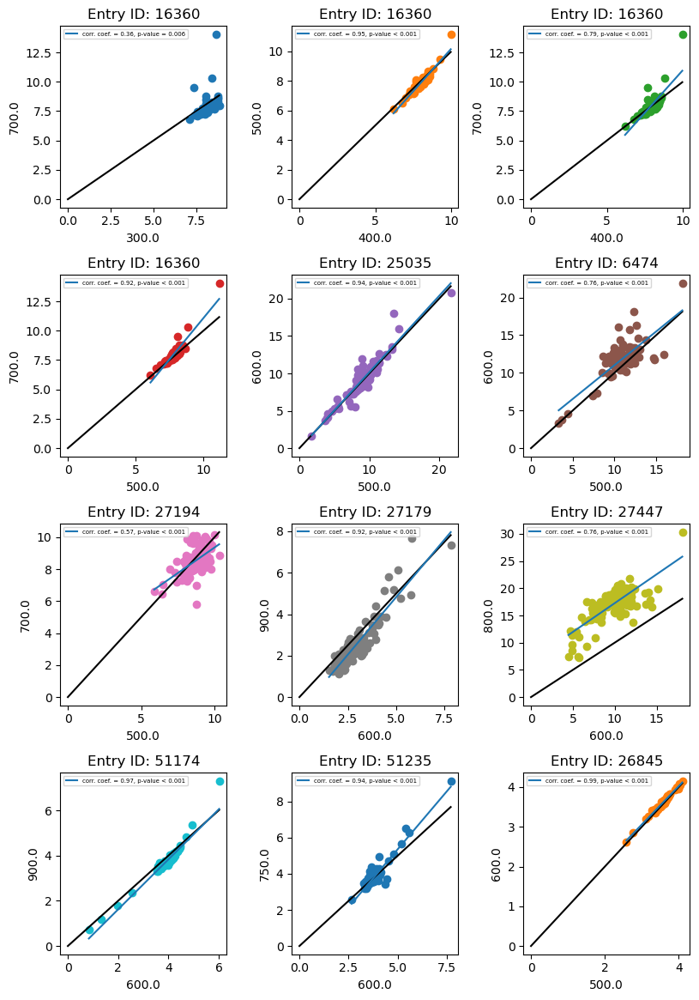

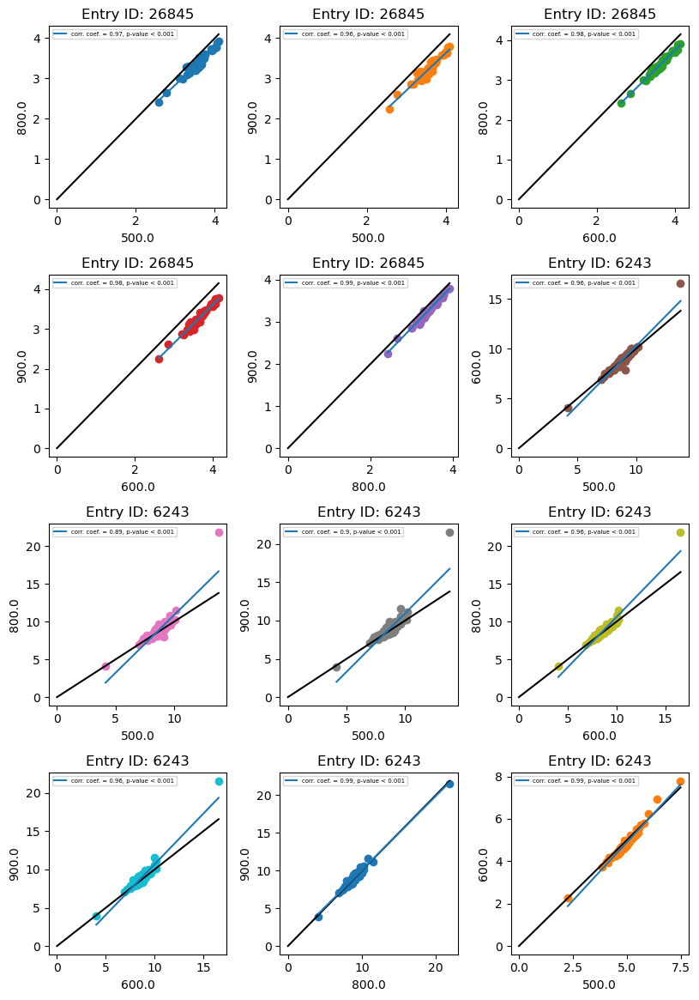

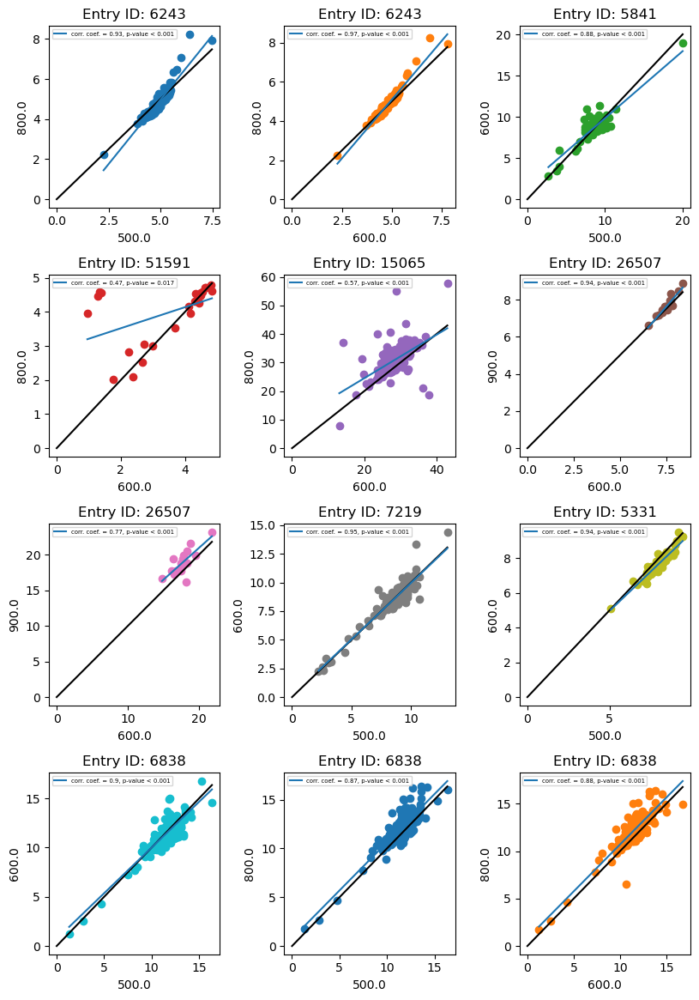

...

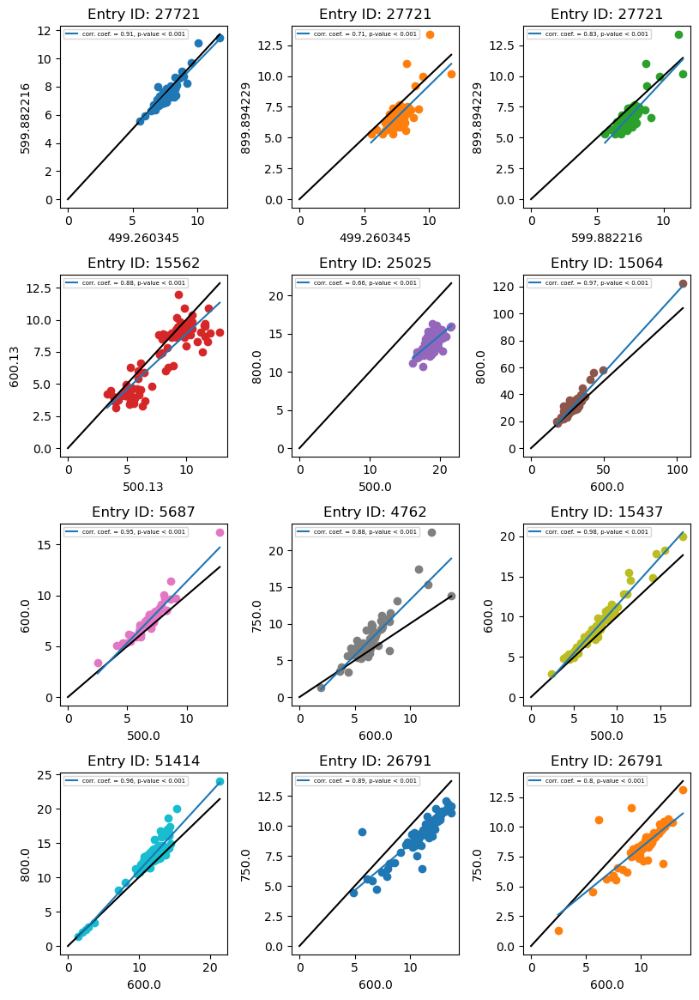

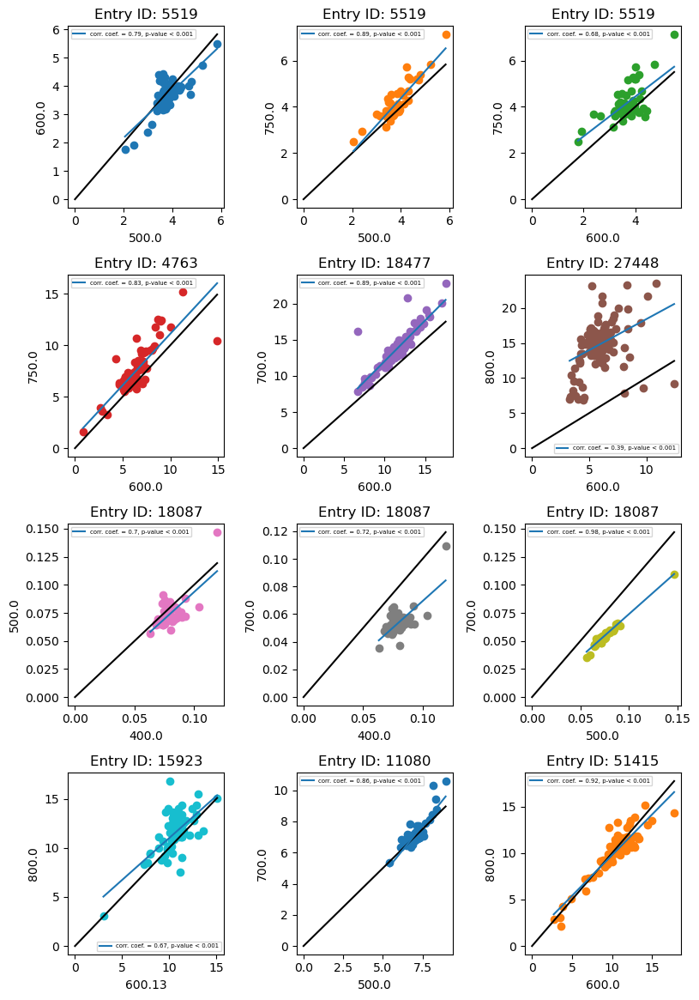

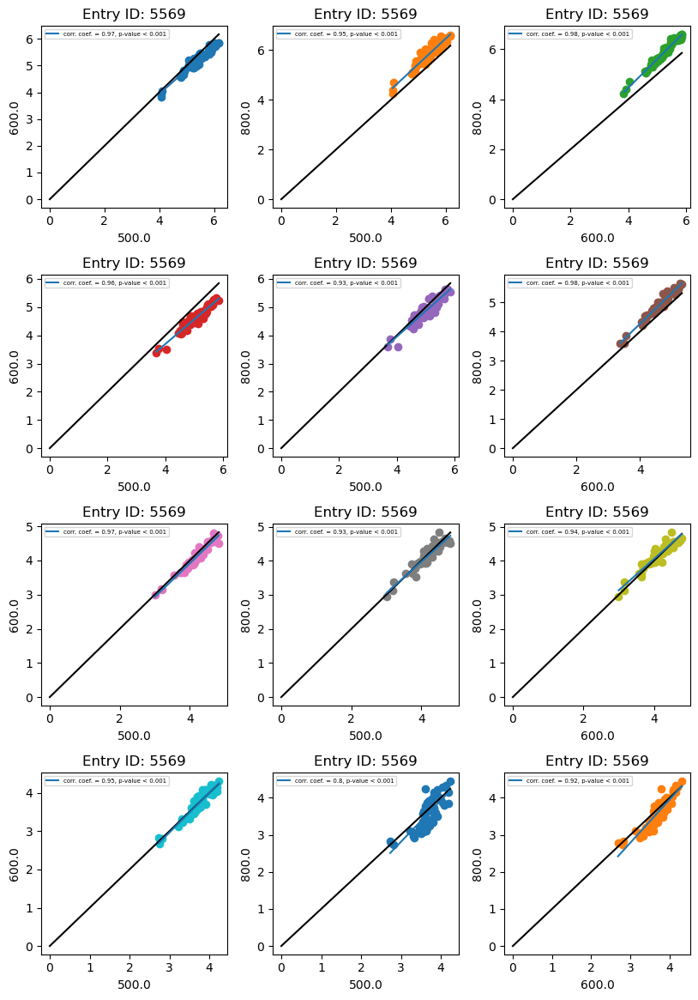

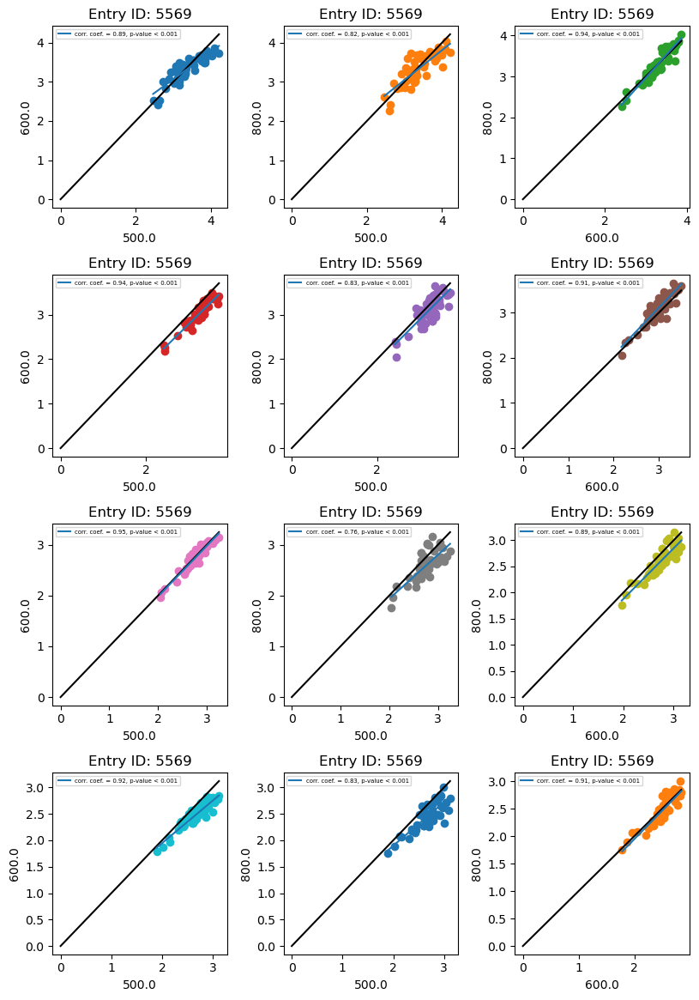

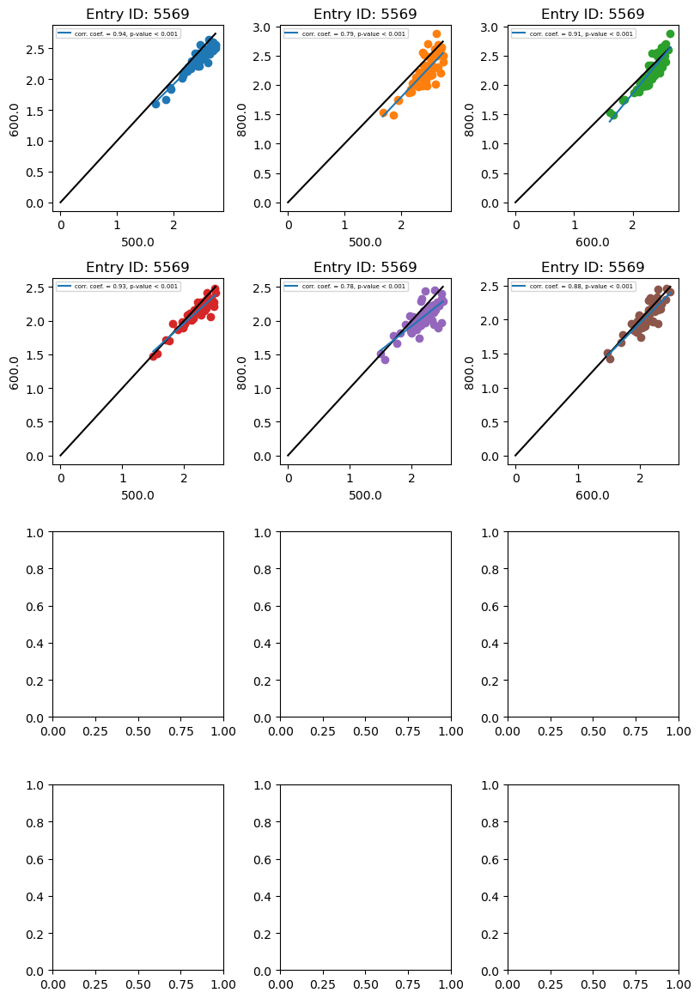

In [87]:
field_correlations={}
with PdfPages('fields_correls_cor_coef.pdf') as pdf:

    plots=0
    
    plt.rcParams["figure.figsize"] = [8.25, 11.75]
    plt.rcParams["figure.autolayout"] = True
    fig, axs = plt.subplots(4, 3)
    
    i=0
    
    
    smallers={300:0, 360:1, 400:2, 500:3, 600:4, 700:5, 800:6, 850:7}
    biggers={400:9, 500:8, 600:7, 700:6, 720:5, 750:4, 800:3, 850:2, 900:1, 950:0}

    j=0
    for entry in experiments:
        if entry!='4697':
        #if entry in ['18864','16360','26845','6243']:
            for condition in experiments[entry]['T2measur']:
                if len(experiments[entry]['T2measur'][condition])>1:
                    #print(entry)
                    fields={}
                    for meas in experiments[entry]['T2measur'][condition]:
                        if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
                            fields[experiments[entry]['T2measur'][condition][meas]['field']]=meas
                    fields=dict(sorted(fields.items()))

                    for smaller_c in fields:
                        for bigger_c in fields:
                            if bigger_c>smaller_c:

                                if int(float(smaller_c))%10==0:
                                    smaller=(int(float(smaller_c)))
                                    smaller_s=smaller_c
                                else:
                                    smaller=(int(float(smaller_c)))+1
                                    smaller_s=smaller_c
                                if int(float(bigger_c))%10==0:
                                    bigger=(int(float(bigger_c)))
                                    bigger_s=bigger_c
                                else:
                                    bigger=(int(float(bigger_c)))+1
                                    bigger_s=bigger_c


                                small=[]
                                for R2 in experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["R2"]:
                                    try:
                                        #small.append(srt.find_tau_from_R2_np_poly1d(float(smaller_s),float(R2))*10**9)
                                        small.append(srt.find_tau_from_R2_hyperbolic_approximation(float(smaller_s),float(R2))*10**9)
                                    except :

                                        small.append(None)



                                big=[]
                                for R2 in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["R2"]:
                                    try:
                                        #big.append(srt.find_tau_from_R2_np_poly1d(float(bigger_s),float(R2))*10**9)
                                        big.append(srt.find_tau_from_R2_hyperbolic_approximation(float(bigger_s),float(R2))*10**9)
                                    except:
                                        big.append(None)
                                        
                                S=[]
                                B=[]
                                for pos,res in enumerate(experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["atomID"]):
                                    if res in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"]:
                                        pos_big=experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"].index(res)
                                        if not small[pos]==None and not big[pos_big]==None:
                                            if experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["AA"][pos]==experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]['AA'][pos_big]:
                                                axs[int(i/3),np.mod(i,3)].plot(small[pos],big[pos_big],"o",c="C"+str(i))
                                                S.append(small[pos])
                                                B.append(big[pos_big])
                                
                                try:
                                    axs[int(i/3),np.mod(i,3)].plot([0,max(S)],[0,max(S)],'-',c='black')  

                                    coeff = np.polyfit(S, B,1,full=True)
                                    xn = np.linspace(min(S),max(S),100)
                                    yn = np.poly1d(coeff[0])
                                    r, p = scipy.stats.pearsonr(S, B)

                                    if p < 0.001:
                                        p=" < 0.001"
                                    else:
                                        p=" = "+str(np.round(p,3))
                                    axs[int(i/3),np.mod(i,3)].plot(xn,yn(xn),"-",label="corr. coef. = "+str(np.round(r,2))+", p-value"+p)

                                    field_correlations[j]={}
                                    field_correlations[j]['smaller']=S
                                    field_correlations[j]['bigger']=B
                                    field_correlations[j]['ID']=entry
                                    field_correlations[j]['CorrCoeff']=np.round(r,2)
                                    field_correlations[j]['eq']=coeff[0]
                                    field_correlations[j]['smaller_lab']=smaller_s
                                    field_correlations[j]['bigger_lab']=bigger_s
                                    e=str(entry)
                                    axs[int(i/3),np.mod(i,3)].legend(prop={'size':5})
                                    axs[int(i/3),np.mod(i,3)].set_ylabel(bigger_s)
                                    axs[int(i/3),np.mod(i,3)].set_xlabel(smaller_s)
                                    axs[int(i/3),np.mod(i,3)].set_title("Entry ID: "+e)
                                    i+=1
                                    j+=1

                                except:
                                    pass
    
    
        
                                if (i%12==0 and i!=0):
                                    i=0
                                    pdf.savefig()  # saves the current figure into a pdf page
                                    plt.rcParams["figure.figsize"] = [8.25, 11.75]
                                    plt.rcParams["figure.autolayout"] = True
                                    fig, axs = plt.subplots(4, 3)

    pdf.savefig()         

In [88]:
field_correlations
sorted_dic1 = dict(sorted(field_correlations.items(), key=lambda item: item[1]['CorrCoeff'],reverse=True))


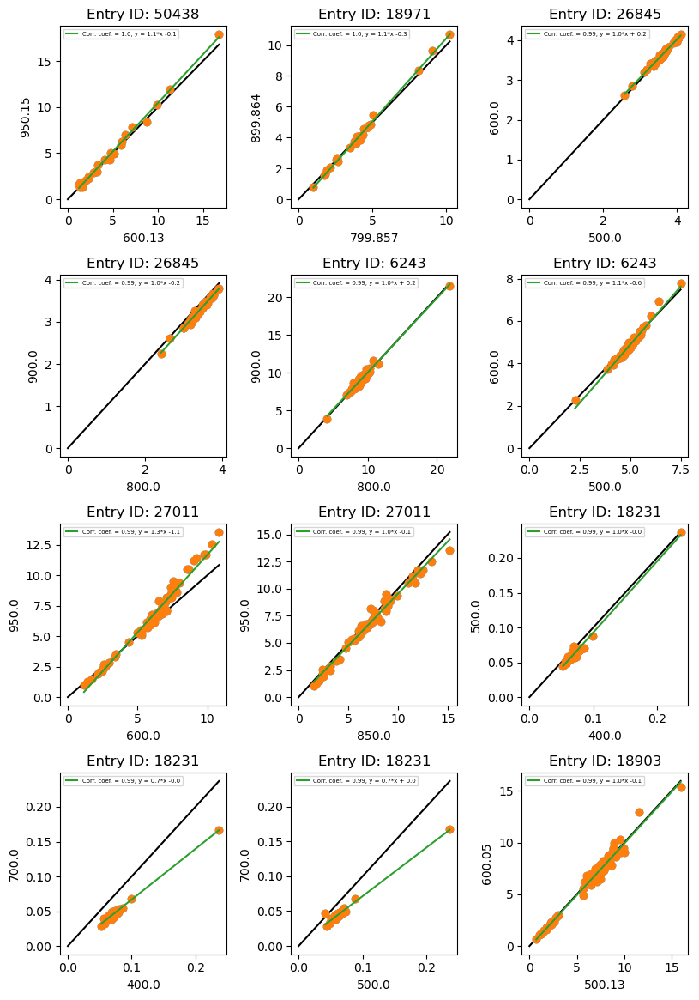

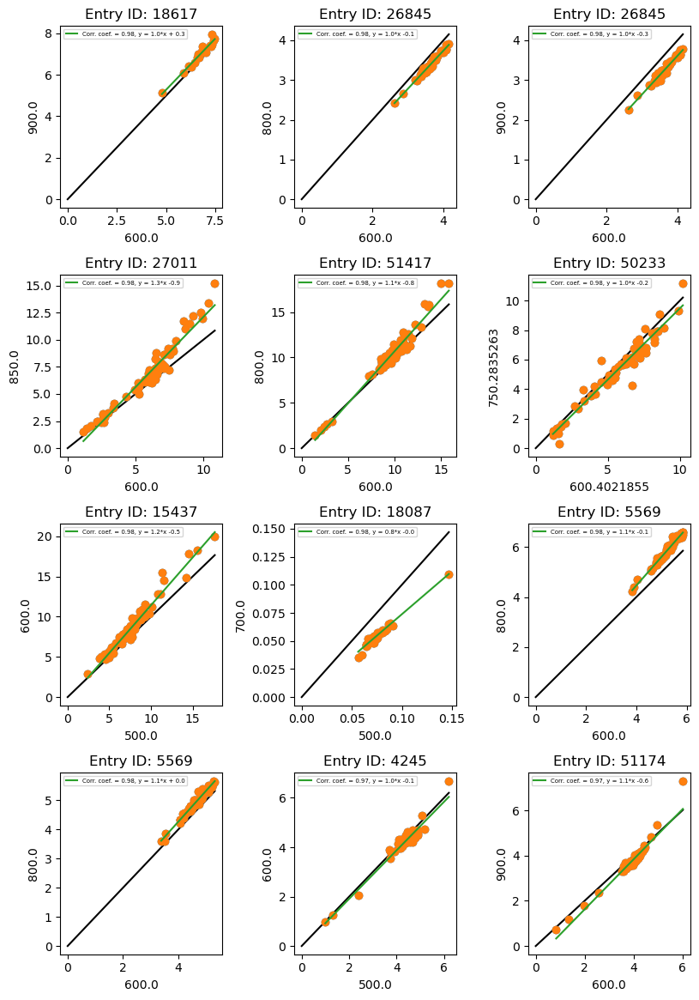

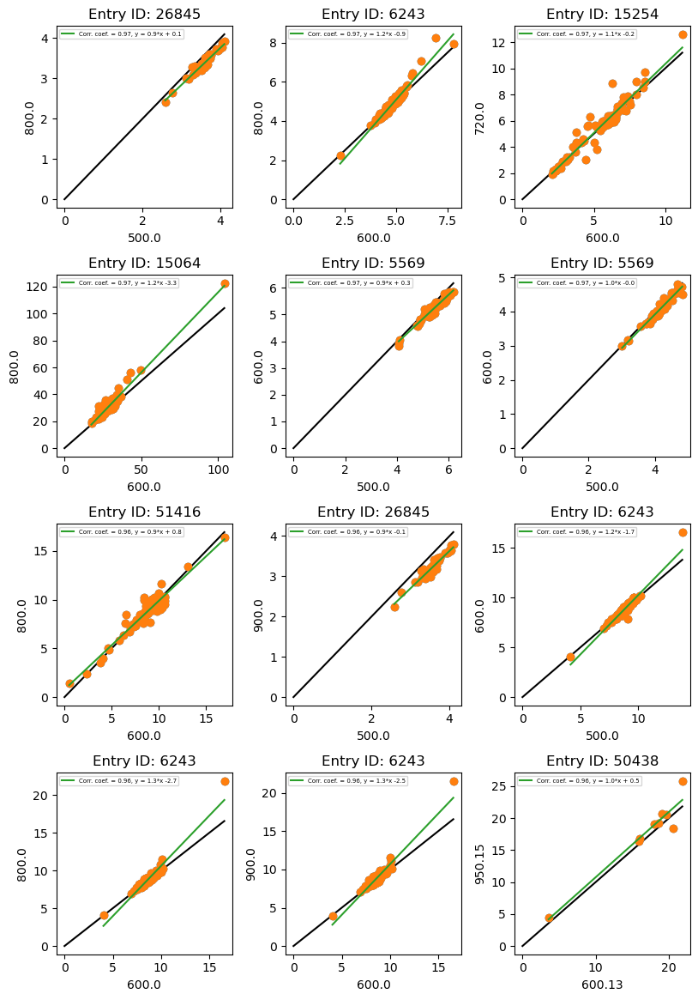

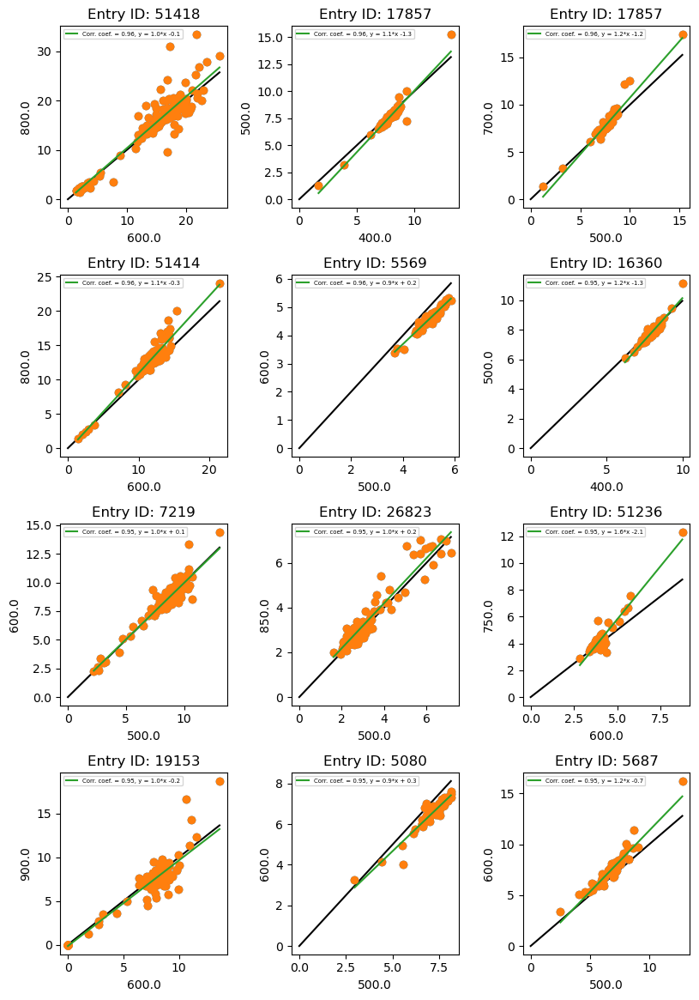

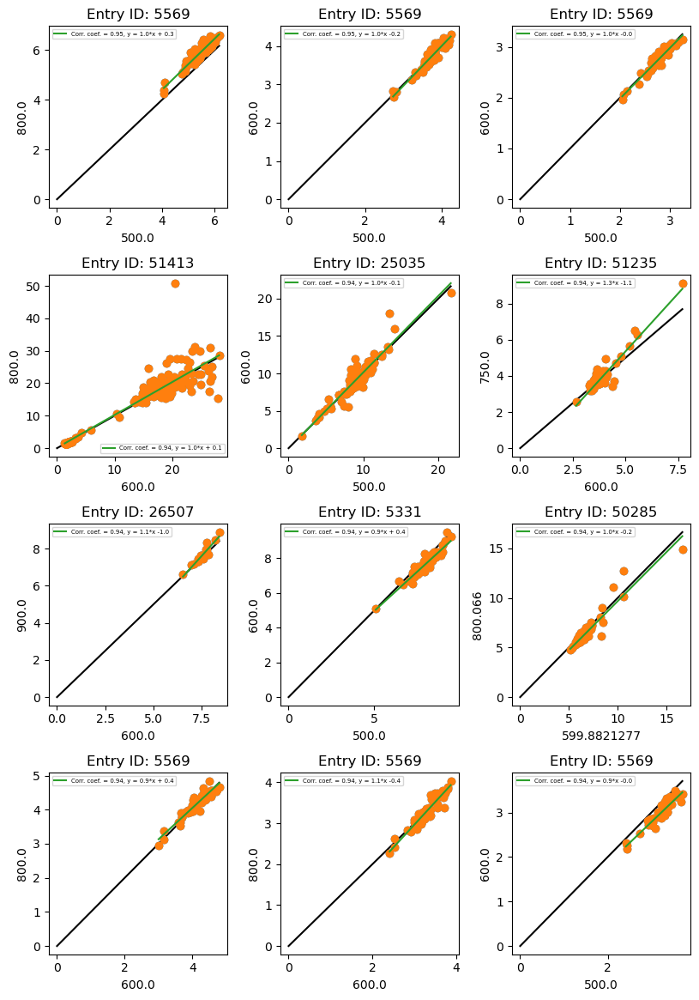

...

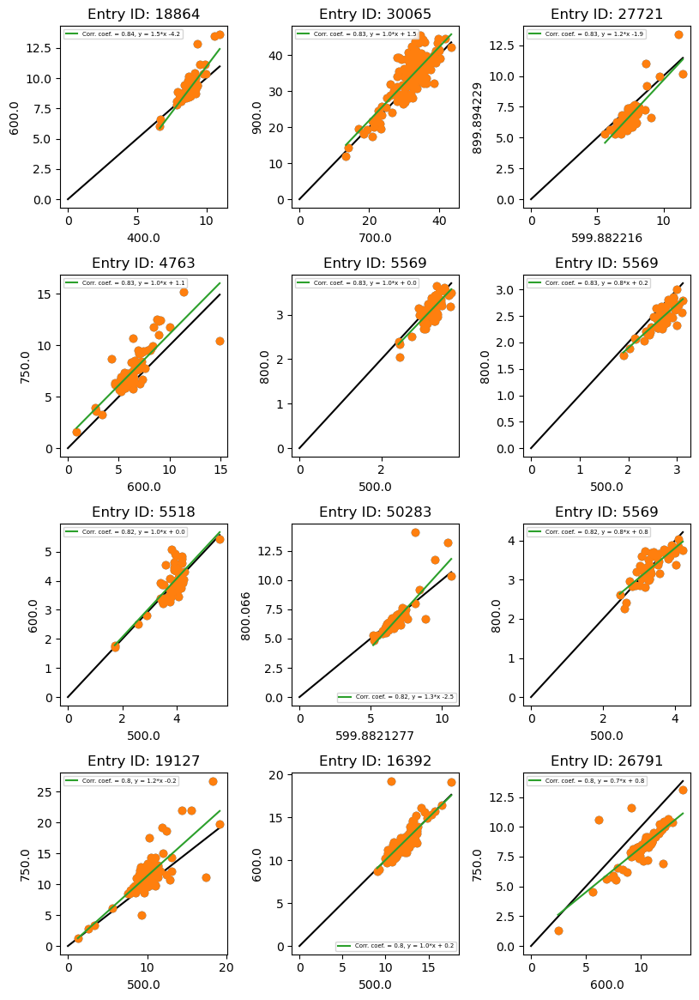

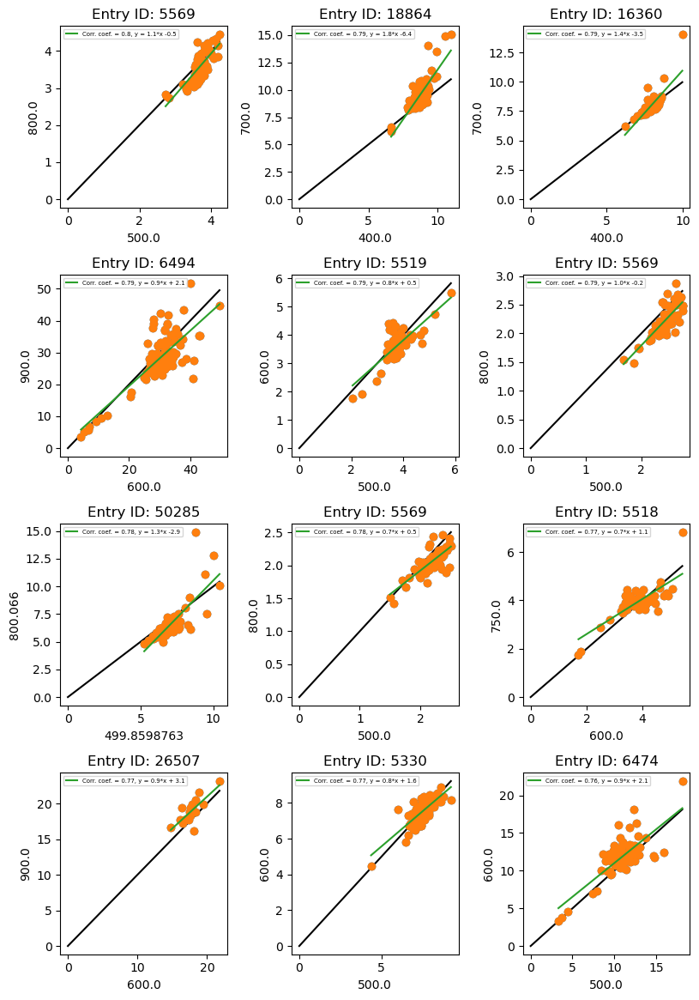

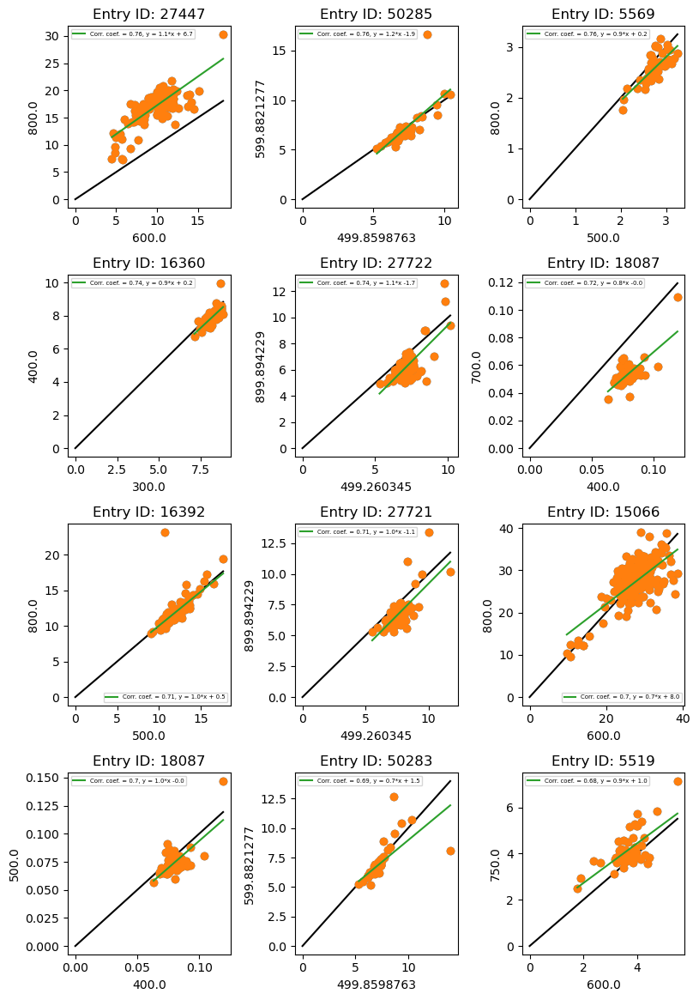

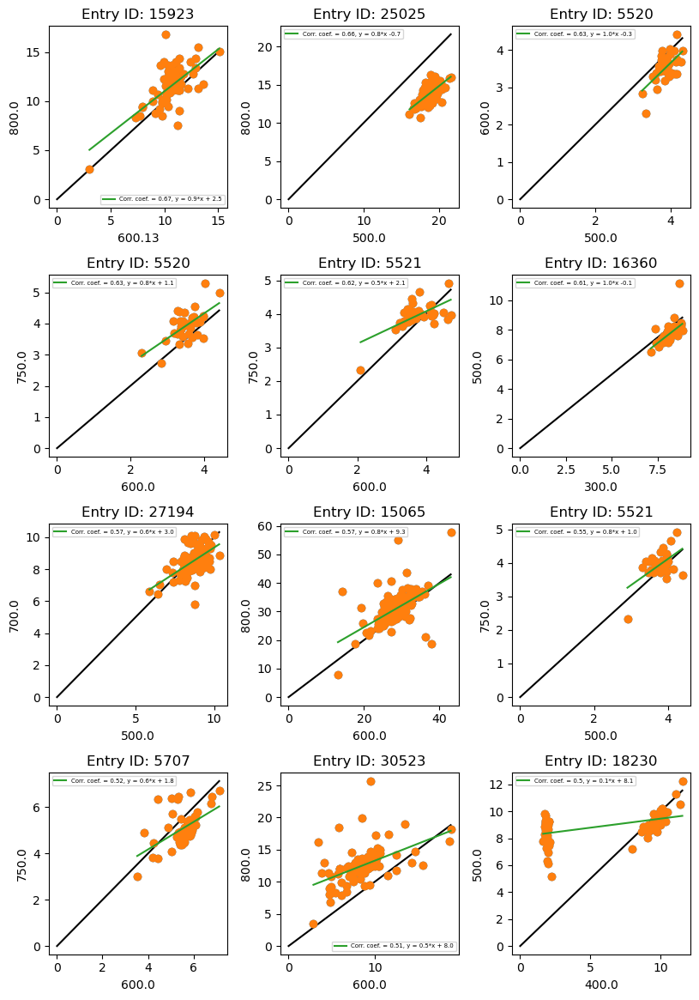

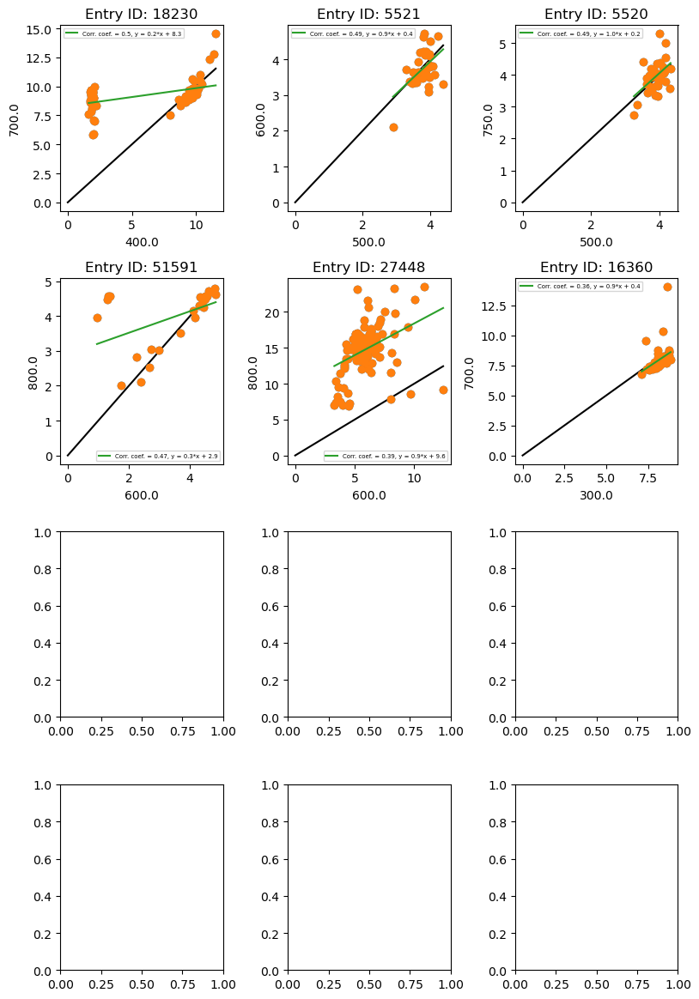

In [89]:
with PdfPages('fields_correls_cor_coef.pdf') as pdf:
    plots=0
    
    plt.rcParams["figure.figsize"] = [8.25, 11.75]
    plt.rcParams["figure.autolayout"] = True
    fig, axs = plt.subplots(4, 3)
    
    i=0
    for k,data in sorted_dic1.items():
        axs[int(i/3),np.mod(i,3)].plot([0,max(data['smaller'])],[0,max(data['smaller'])],'-',c='black')
        axs[int(i/3),np.mod(i,3)].set_title(f"Entry ID: {data['ID']}")
        axs[int(i/3),np.mod(i,3)].plot(data['smaller'],data['bigger'],'o')
        axs[int(i/3),np.mod(i,3)].plot(data['smaller'],data['bigger'],'o')
        
        xn = np.linspace(min(data['smaller']),max(data['smaller']),100)
        coeff=data['eq']
        yn = np.poly1d(coeff)
        if coeff[1]>0:
            axs[int(i/3),np.mod(i,3)].plot(xn,yn(xn),"-",label=f"Corr. coef. = {data['CorrCoeff']}, y = {coeff[0]:.1f}*x + {coeff[1]:.1f}")
        else:
            axs[int(i/3),np.mod(i,3)].plot(xn,yn(xn),"-",label=f"Corr. coef. = {data['CorrCoeff']}, y = {coeff[0]:.1f}*x {coeff[1]:.1f}")
        axs[int(i/3),np.mod(i,3)].set_xlabel(data['smaller_lab'])
        axs[int(i/3),np.mod(i,3)].set_ylabel(data['bigger_lab'])
        axs[int(i/3),np.mod(i,3)].legend(prop={'size':5})
        i+=1
        
    
    
        if (i%12==0 and i!=0):
            i=0
            pdf.savefig()  # saves the current figure into a pdf page
            plt.rcParams["figure.figsize"] = [8.25, 11.75]
            plt.rcParams["figure.autolayout"] = True
            fig, axs = plt.subplots(4, 3)

    pdf.savefig()         
        

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

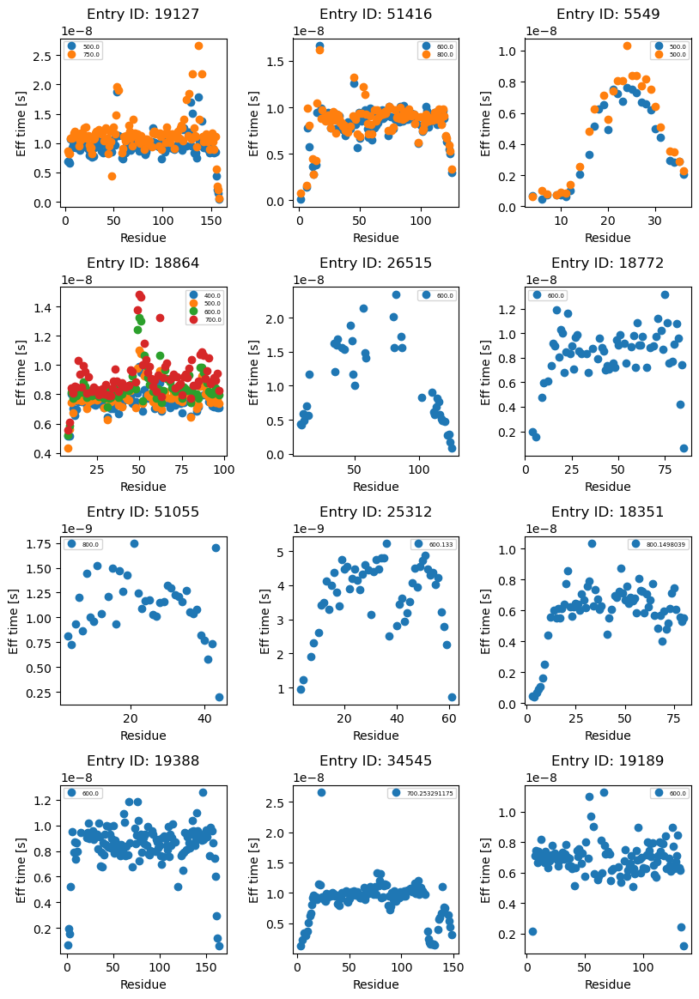

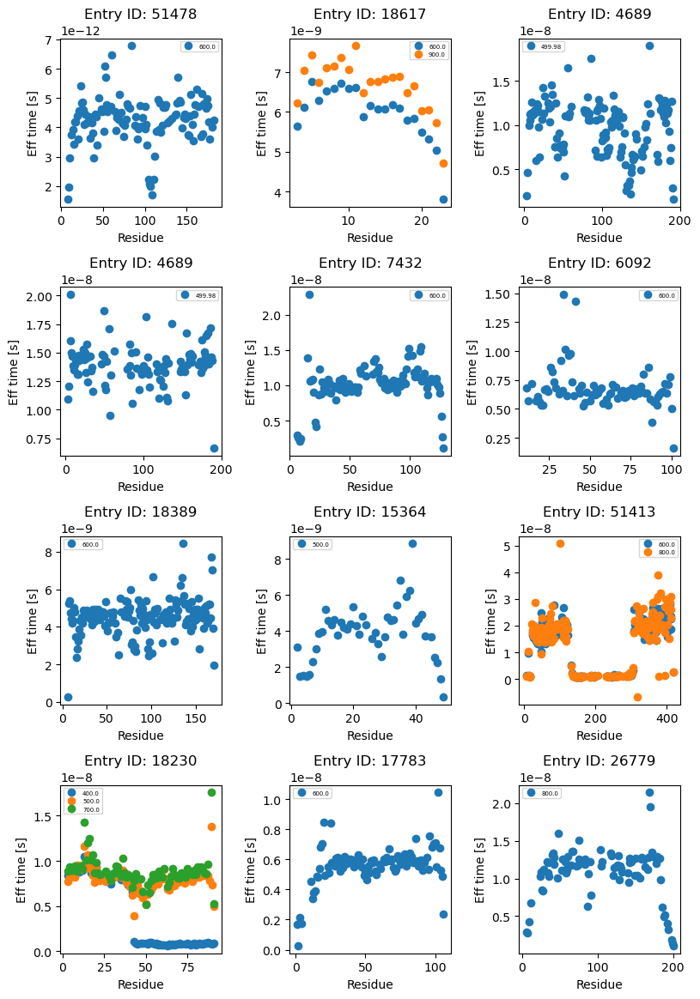

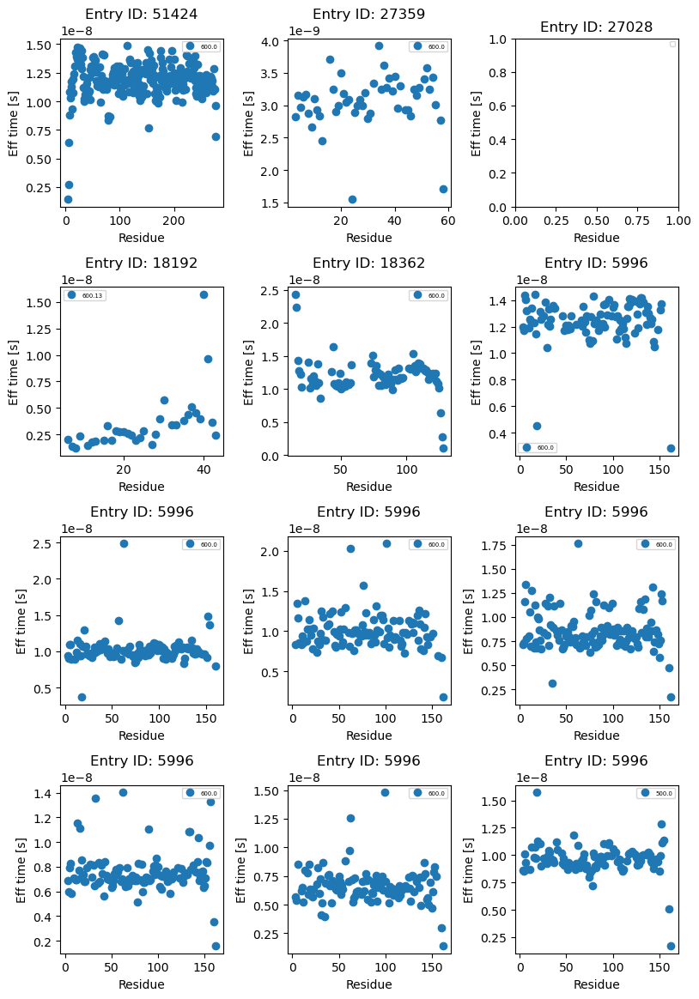

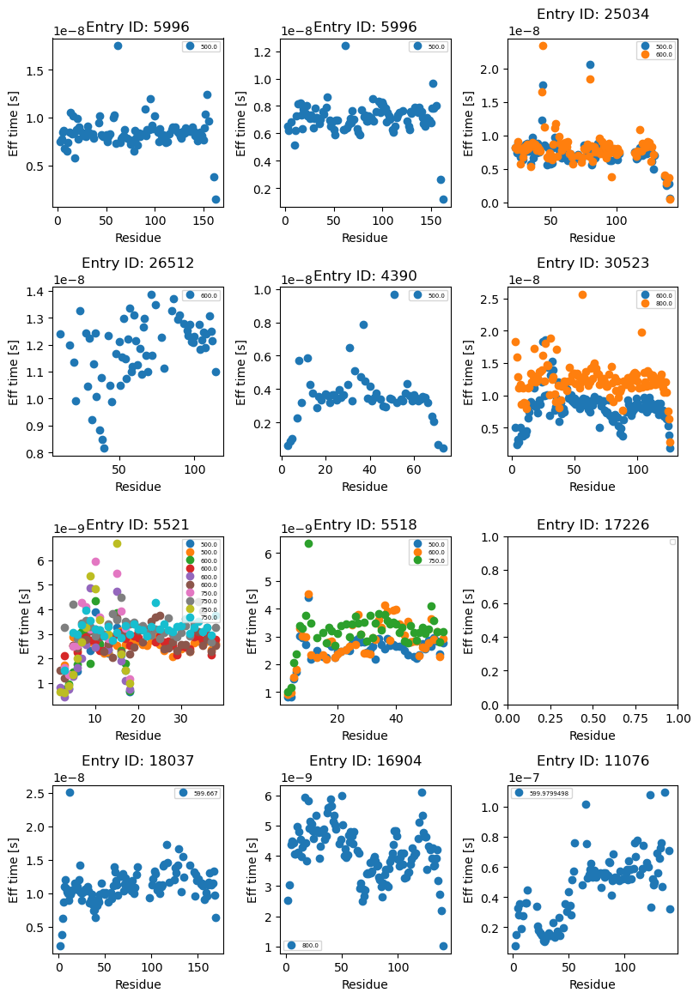

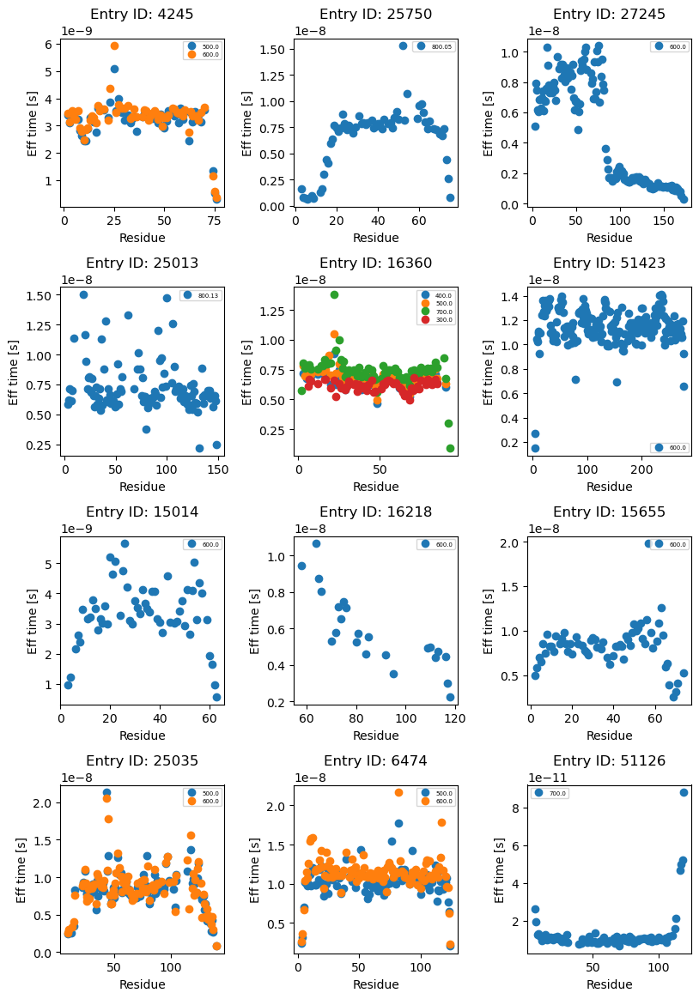

...

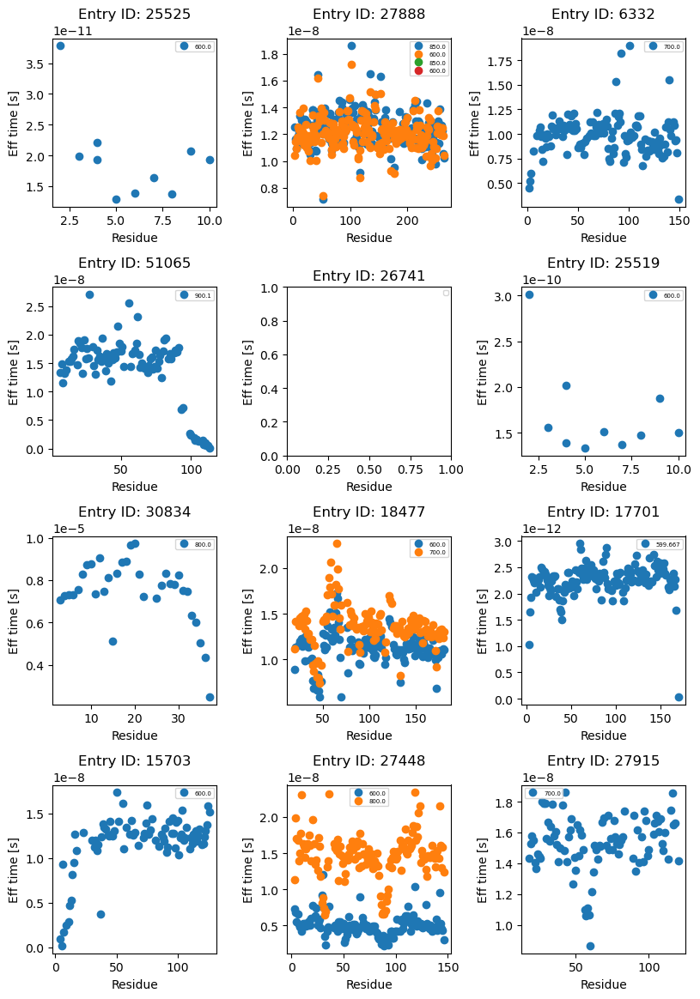

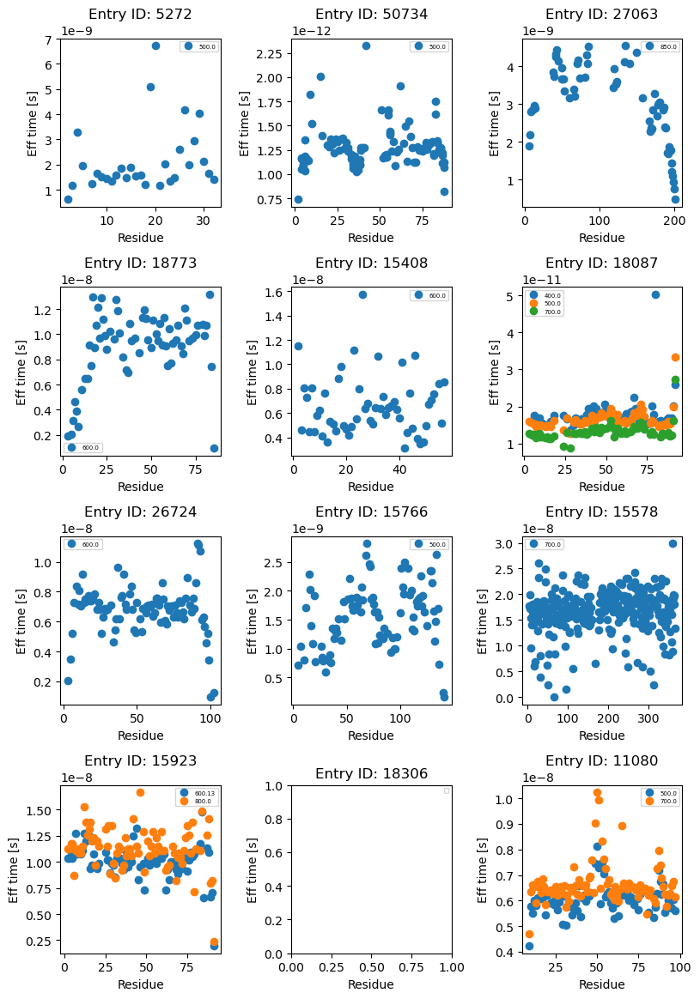

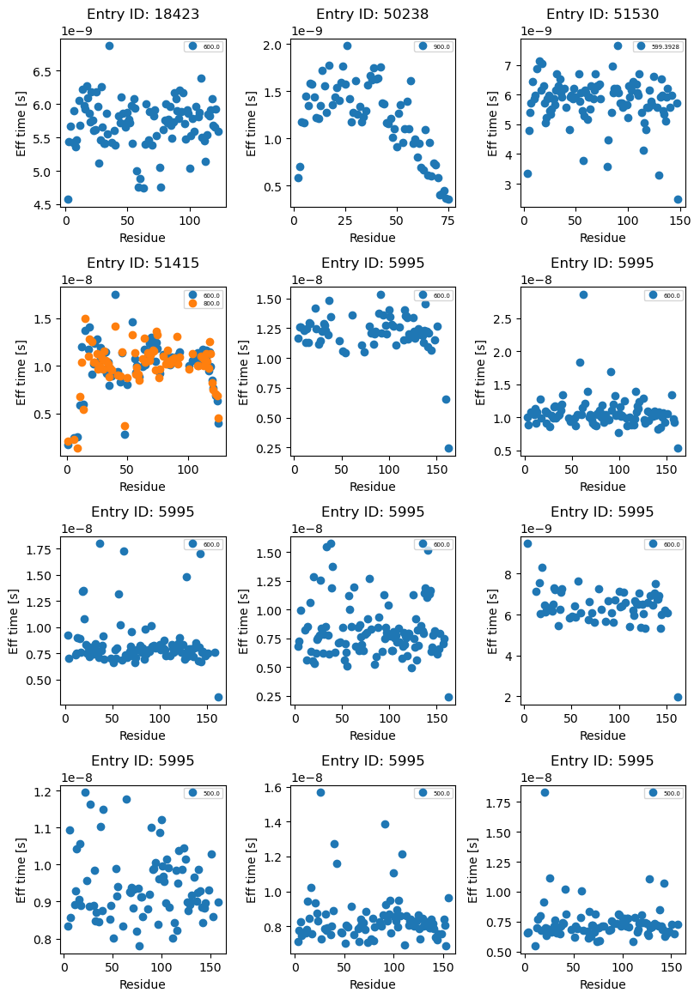

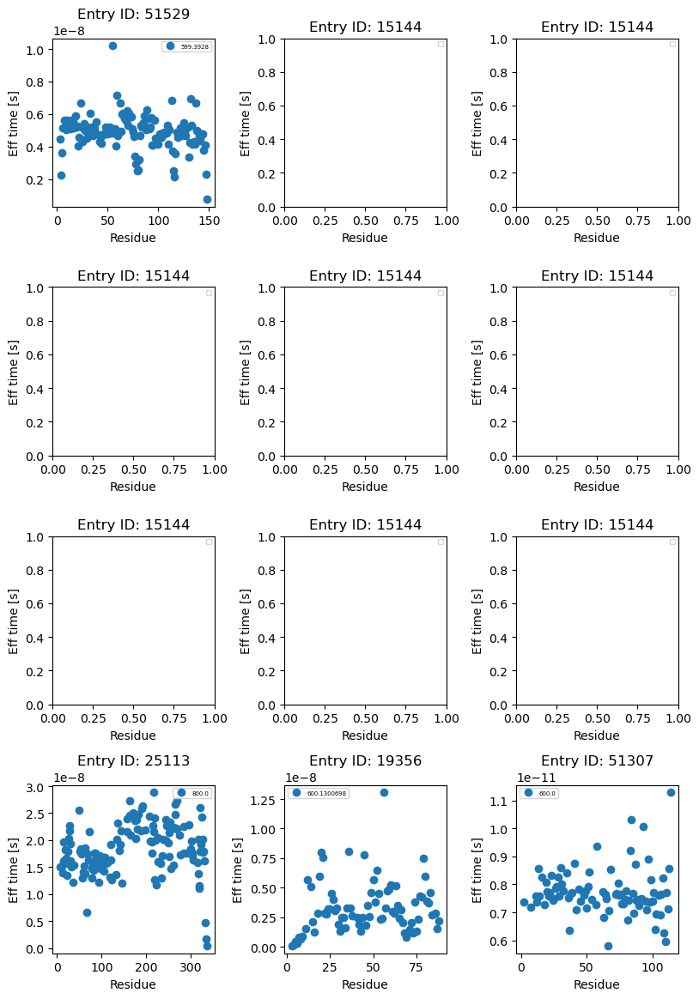

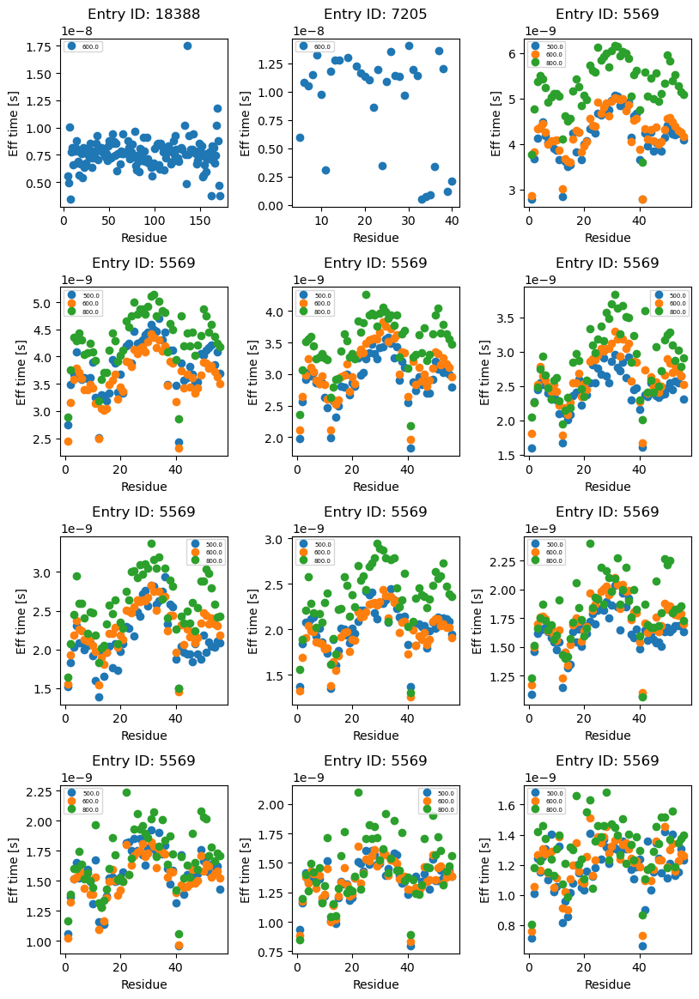

In [54]:
with PdfPages('all_data.pdf') as pdf:
    plots=0
    
    plt.rcParams["figure.figsize"] = [8.25, 11.75]
    plt.rcParams["figure.autolayout"] = True
    fig, axs = plt.subplots(4, 3)
    
    i=0
    
    for entry in experiments:
        if entry!='4697':
            for condition in experiments[entry]['T2measur']:
                if len(experiments[entry]['T2measur'][condition])>0:
                    for meas in experiments[entry]['T2measur'][condition]:
                        if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
    
                            field=experiments[entry]['T2measur'][condition][meas]['field']
                            effTimes=[]
                            #print(entry)
                            for R2 in experiments[entry]['T2measur'][condition][meas]["results"]["R2"]:
                                effTimes.append(srt.find_tau_from_R2_np_poly1d(float(field),float(R2)))
                            

                            axs[int(i/3),np.mod(i,3)].plot(experiments[entry]['T2measur'][condition][meas]['results']['atomID'],effTimes,"o",label=field)

                
                    e=str(entry)
                    axs[int(i/3),np.mod(i,3)].legend(prop={'size':5})
                    axs[int(i/3),np.mod(i,3)].set_ylabel("Eff time [s]")
                    axs[int(i/3),np.mod(i,3)].set_xlabel("Residue")
                    axs[int(i/3),np.mod(i,3)].set_title("Entry ID: "+e)
                    i+=1
        
                    if (i%12==0 and i!=0):
                        i=0
                        pdf.savefig()  # saves the current figure into a pdf page
                        plt.rcParams["figure.figsize"] = [8.25, 11.75]
                        plt.rcParams["figure.autolayout"] = True
                        fig, axs = plt.subplots(4, 3)
    
    pdf.savefig()          
    plt.close()

In [38]:
R2

In [126]:
fields_count={}
for entry in experiments:
    if entry!='4697':
        for condition in experiments[entry]['T2measur']:
            if len(experiments[entry]['T2measur'][condition])>1:
                field=[]
                for mes in experiments[entry]['T2measur'][condition]:
                    if experiments[entry]['T2measur'][condition][mes]['field'] not in field:
                        field.append(experiments[entry]['T2measur'][condition][mes]['field'])
                f=len(field)
                if f not in fields_count:
                    fields_count[f]=0
                fields_count[f]+=1
                if f==4:
                    print(entry)

18864
16360
26845
6243


In [52]:
fields_count

{2: 66, 1: 30, 4: 4, 3: 35}

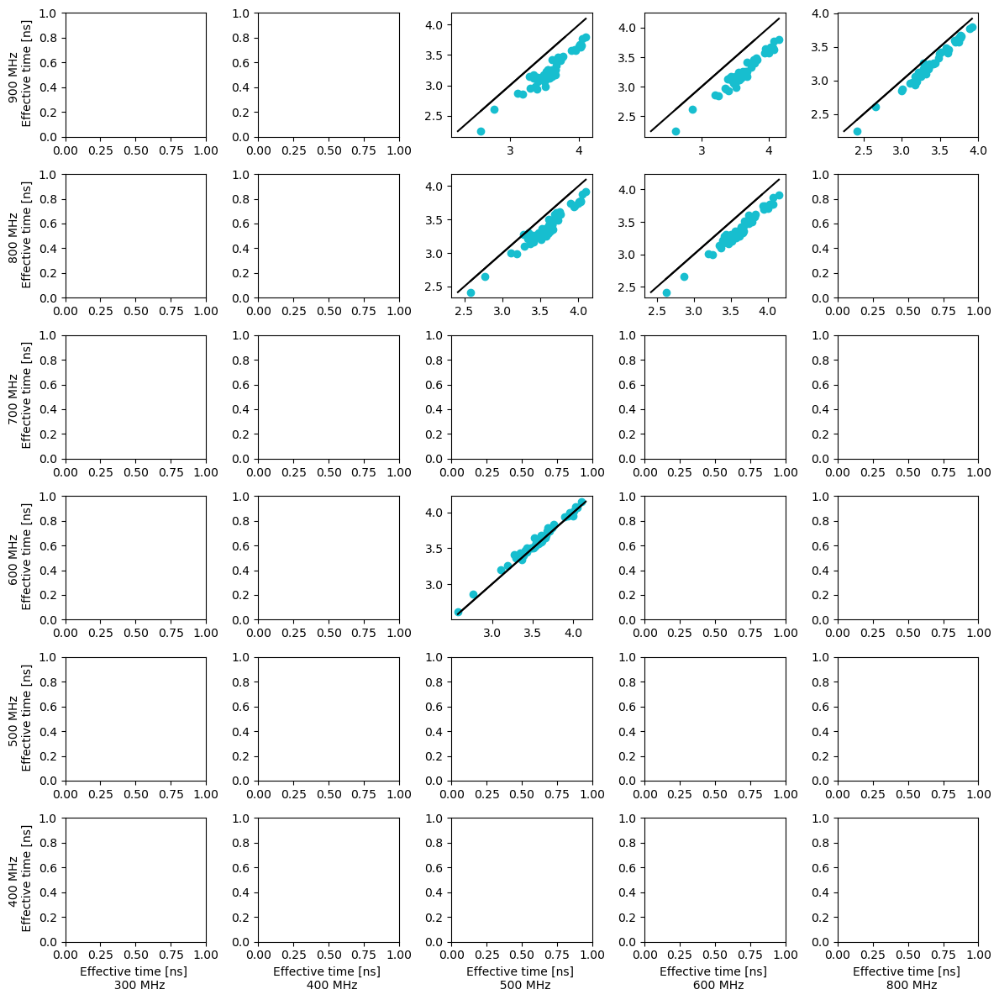

In [129]:
plt.rcParams["figure.autolayout"] = True
smallers={300:0, 400:1, 500:2, 600:3, 800:4}
biggers={400:5, 500:4, 600:3, 700:2, 800:1, 900:0}




fig, axs = plt.subplots(6,5,figsize=(12,12),sharex=False, sharey=False)

for i,entry in enumerate(experiments):
    #if entry!='4697':
    #if entry in ['18864','16360','26845','6243']:
    if entry in ['26845']:
        for condition in experiments[entry]['T2measur']:
            if len(experiments[entry]['T2measur'][condition])>1:
                #print(entry)
                fields={}
                for meas in experiments[entry]['T2measur'][condition]:
                    if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
                        fields[experiments[entry]['T2measur'][condition][meas]['field']]=meas
                fields=dict(sorted(fields.items()))

                for smaller_c in fields:
                    for bigger_c in fields:
                        if bigger_c>smaller_c:

                            if int(float(smaller_c))%10==0:
                                smaller=(int(float(smaller_c)))
                                smaller_s=smaller_c
                            else:
                                smaller=(int(float(smaller_c)))+1
                                smaller_s=smaller_c
                            if int(float(bigger_c))%10==0:
                                bigger=(int(float(bigger_c)))
                                bigger_s=bigger_c
                            else:
                                bigger=(int(float(bigger_c)))+1
                                bigger_s=bigger_c


                            small=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["R2"]:
                                try:
                                    #small.append(srt.find_tau_from_R2_np_poly1d(float(smaller_s),float(R2))*10**9)
                                    small.append(srt.find_tau_from_R2_hyperbolic_approximation(float(smaller_s),float(R2))*10**9)
                                except :
  
                                    small.append(None)



                            big=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["R2"]:
                                try:
                                    #big.append(srt.find_tau_from_R2_np_poly1d(float(bigger_s),float(R2))*10**9)
                                    big.append(srt.find_tau_from_R2_hyperbolic_approximation(float(bigger_s),float(R2))*10**9)
                                except:
                                    big.append(None)
                            
                            S=[]
                            B=[]
                            for pos,res in enumerate(experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["atomID"]):
                                if res in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"]:
                                    pos_big=experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"].index(res)
                                    if not small[pos]==None and not big[pos_big]==None:
                                        if experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["AA"][pos]==experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]['AA'][pos_big]:
                                            axs[biggers[bigger],smallers[smaller]].plot(small[pos],big[pos_big],"o",c="C"+str(i//2+2))
                                            S.append(small[pos])
                                            B.append(big[pos_big])
                            axs[biggers[bigger],smallers[smaller]].plot([min(S),max(S)],[min(S),max(S)],'-',c='black')  
                            axs[biggers[bigger],smallers[smaller]].plot([min(B),max(B)],[min(B),max(B)],'-',c='black')  

                            



for xlabel,column in smallers.items():
    axs[5,column].set_xlabel(f'Effective time [ns] \n  {xlabel} MHz')
    
for ylabel,row in biggers.items():
    axs[row,0].set_ylabel(f'{ylabel} MHz \n Effective time [ns]')
    
#axs[0,0].set_ylim(0,60)
#axs[0,0].set_xlim(0,60)
    
plt.savefig("field_dependency_lin_approx_corr_4fields.png")

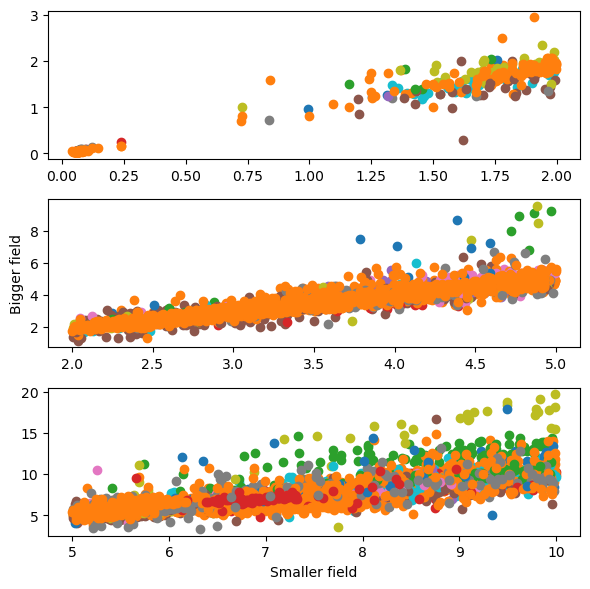

In [118]:
plt.rcParams["figure.autolayout"] = True
smallers={300:0, 360:1, 400:2, 500:3, 600:4, 700:5, 800:6, 850:7}
biggers={400:9, 500:8, 600:7, 700:6, 720:5, 750:4, 800:3, 850:2, 900:1, 950:0}




fig, axs = plt.subplots(3,1,figsize=(6,6),sharex=False,sharey=False)
S_fast=[]
B_fast=[]
S_mid=[]
B_mid=[]
S_slow=[]
B_slow=[]
for i,entry in enumerate(experiments):
    if entry!='4697':
        for condition in experiments[entry]['T2measur']:
            if len(experiments[entry]['T2measur'][condition])>1:
                #print(entry)
                fields={}
                for meas in experiments[entry]['T2measur'][condition]:
                    if experiments[entry]['T2measur'][condition][meas]['expType'] == 'N':
                        fields[experiments[entry]['T2measur'][condition][meas]['field']]=meas
                fields=dict(sorted(fields.items()))

                for smaller_c in fields:
                    for bigger_c in fields:
                        if bigger_c>smaller_c:

                            if int(float(smaller_c))%10==0:
                                smaller=(int(float(smaller_c)))
                                smaller_s=smaller_c
                            else:
                                smaller=(int(float(smaller_c)))+1
                                smaller_s=smaller_c
                            if int(float(bigger_c))%10==0:
                                bigger=(int(float(bigger_c)))
                                bigger_s=bigger_c
                            else:
                                bigger=(int(float(bigger_c)))+1
                                bigger_s=bigger_c


                            small=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["R2"]:
                                try:
                                    #small.append(srt.find_tau_from_R2_np_poly1d(float(smaller_s),float(R2))*10**9)
                                    small.append(srt.find_tau_from_R2_hyperbolic_approximation(float(smaller_s),float(R2))*10**9)
                                except :
  
                                    small.append(None)



                            big=[]
                            for R2 in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["R2"]:
                                try:
                                    #big.append(srt.find_tau_from_R2_np_poly1d(float(bigger_s),float(R2))*10**9)
                                    big.append(srt.find_tau_from_R2_hyperbolic_approximation(float(bigger_s),float(R2))*10**9)
                                except:
                                    big.append(None)
                            S_fast=[]
                            B_fast=[]
                            S_mid=[]
                            B_mid=[]
                            S_slow=[]
                            B_slow=[]
                            for pos,res in enumerate(experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["atomID"]):
                                if res in experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"]:
                                    pos_big=experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]["atomID"].index(res)
                                    if not small[pos]==None and not big[pos_big]==None:
                                        if experiments[entry]['T2measur'][condition][fields[smaller_c]]["results"]["AA"][pos]==experiments[entry]['T2measur'][condition][fields[bigger_c]]["results"]['AA'][pos_big]:
                                            if small[pos]<2 and big[pos_big]<2*small[pos]:
                                                S_fast.append(small[pos])
                                                B_fast.append(big[pos_big])
                                                
                                            elif small[pos]<5 and big[pos_big]<2*small[pos]:
                                                S_mid.append(small[pos])
                                                B_mid.append(big[pos_big])
                                            elif small[pos]<10 and big[pos_big]<2*small[pos]:
                                                S_slow.append(small[pos])
                                                B_slow.append(big[pos_big])
                            axs[0].plot(S_fast,B_fast,"o",c="C"+str(i))
                            axs[1].plot(S_mid,B_mid,"o",c="C"+str(i))
                            axs[2].plot(S_slow,B_slow,"o",c="C"+str(i))
                            #axs[0].plot([0,25],[0,25],'-',c='black')  
                            i=+1


axs[2].set_xlabel("Smaller field")
    
axs[1].set_ylabel("Bigger field")
plt.savefig('different_times4.png')